In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from argparse import Namespace
from pathlib import Path
import torch
from pytorch_lightning.trainer import Trainer, seed_everything
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

from turboflow.dataloaders import TurboFlowDataModule
from turboflow.evaluation import compute_all_metrics

from turboflow.utils import phy_utils as phy
from turboflow.utils import torch_utils as tch

import matplotlib.pyplot as plt

In [37]:
seed = 66
seed_everything(seed, workers=True)

# load dataset
data_dir = Path('/','home','dicarlo_d','Documents','Datasets','Turb2D.hdf5')
dm = TurboFlowDataModule(dataset='Turb2D', 
                         data_dir=data_dir,
                         batch_size=100000,
                         time_idx=0,
                         train_downsampling=8,
                         val_downsampling=4,
                         test_downsampling=1,
                         num_workers=1)
dm.setup()


X_lr, y_lr = dm.train_dataset[:]
img_shape_lr = dm.train_dataset.img_shape[:2]
shape_lr = dm.train_dataset.img_shape
L = shape_lr[0]
N_lr = X_lr.shape[0]
print(N_lr, L)

X_mr, y_mr = dm.val_dataset[:]
img_shape_mr = dm.val_dataset.img_shape[:2]
shape_mr = dm.val_dataset.img_shape
M = shape_mr[0]
N_mr = X_mr.shape[0]
print(N_mr, M)

X_hr, y_hr = dm.test_dataset[:]
img_shape_hr = dm.test_dataset.img_shape[:2]
shape_hr = dm.test_dataset.img_shape
H = shape_hr[0]
N_hr = X_hr.shape[0]
print(N_hr, H)

from turboflow.models.phyrff_hard import plDivFreeRFFNet

# choose the hyperparams
hparams = {
    'name':'RFFNet',
    'mlp_layers_num': 3,
    'mlp_layers_dim': 256, 
    'mlp_last_actfn': 'tanh',
    'do_rff': True, 
    'rff_num': 512, 
    'rff_scale': 10,
    'do_divfree': False,
    'lam_pde':  0,     # soft constr. grad(u,v)=0
    'lam_sdiv': 1e-4,     # spatial grad(u,v) = torch.autograd(u,v)
    'lam_sfn':  0,     # offgrid L2 reg. on Sfun
    'lam_spec': 0,    # L2 diff on the spectrum
    'lam_grads':0, #1e-4,    # offrgid L2 reg. on grad and autograd
    'lam_curl' :0, #1e-8,       # smooth grad of vorticity
    'lam_weight': 1e-4,  # L2 reg on the NN's weights
    'sfn_min_x': 1./256., # maximal resolution
    'sfn_num_centers': 16,
    'sfn_num_increments':3,
    'sfn_patch_dim': 16 # (P/2)
}

model = plDivFreeRFFNet(**vars(Namespace(**hparams)))

Global seed set to 66


1024 32
4096 64
65536 256


In [38]:
early_stop_callback = EarlyStopping(monitor='val/loss/tot',min_delta=1e-5)
checkpoint_callback = ModelCheckpoint(
    monitor="val/loss/tot",
    dirpath=".torch_checkpoints",
    filename="Turb2D-%s-{epoch:02d}-{val_loss:.2f}" % (hparams['name']),
    save_top_k=1,
    mode="min",
)

trainer = Trainer(gpus=1,
                  max_epochs=3000, 
                  log_every_n_steps=20,
                  check_val_every_n_epoch=20, 
                  callbacks=[early_stop_callback,
                             checkpoint_callback])

trainer.fit(model, dm)

/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:446: UserWarning: Checkpoint directory .torch_checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/core/datamodule.py:423: LightningDeprecationWarning: DataModule.setup has already been called, so it will not be called again. In v1.6 this behavior will change to always call DataModule.setup.
  rank_zero_deprecation(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type            | Params
--------------------------------------------
0 | rff     | Fourier         | 1.0 K 
1 | mlp     | MLP             | 394 K 
2 | mtl     | MTL             | 4     
3 | sp_grad | SpatialGradient | 0 

Validation sanity check: 0it [00:00, ?it/s]

/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:105: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 48 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
Global seed set to 66
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:105: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 48 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:326: UserWarning: The numb

Training: -1it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

In [5]:
checkpoint_callback.best_model_path

'/home/dicarlo_d/Documents/Code/TurboSuperResultion/notebooks/.torch_checkpoints/Turb2D-RFFNet-epoch=599-val_loss=0.00-v1.ckpt'

Global seed set to 67
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:446: UserWarning: Checkpoint directory .torch_checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/core/datamodule.py:423: LightningDeprecationWarning: DataModule.setup has already been called, so it will not be called again. In v1.6 this behavior will change to always call DataModule.setup.
  rank_zero_deprecation(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type            | Params
--------------------------------------------
0 | rff     | Fourier         | 1.0 K 
1 | mlp     | MLP             | 394 K 
2 | mtl     | MTL             | 4     
3 | sp_grad 

Validation sanity check: 0it [00:00, ?it/s]

/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:105: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 48 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


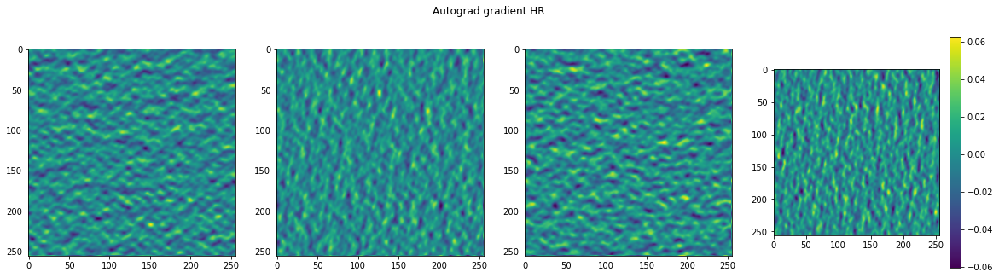

1.4521656339638866e-05 1.782443723641336e-05 1.9153396351612173e-05 2.3389033231069334e-05


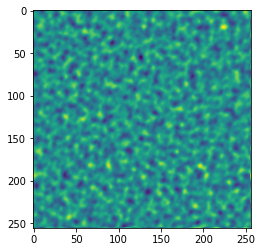

Global seed set to 67
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:105: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 48 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:326: UserWarning: The number of training samples (1) is smaller than the logging interval Trainer(log_every_n_steps=20). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: -1it [00:00, ?it/s]

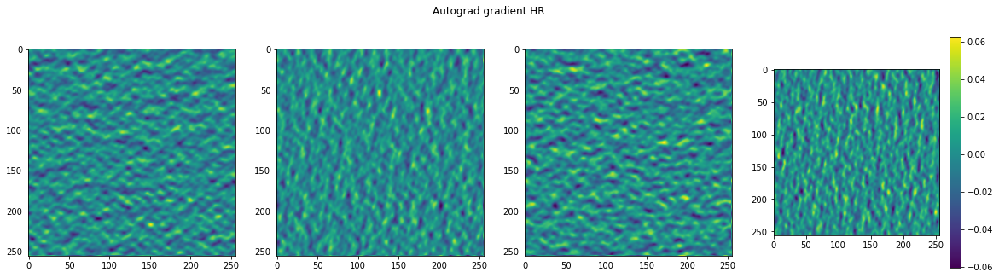

1.4521656339638866e-05 1.782443723641336e-05 1.9153396351612173e-05 2.3389033231069334e-05


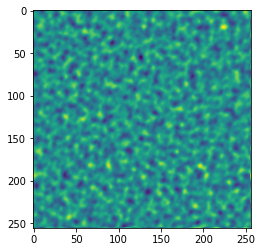

Validating: 0it [00:00, ?it/s]

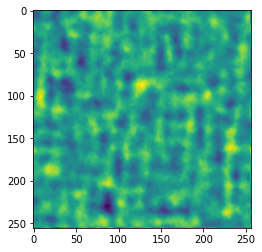

Validating: 0it [00:00, ?it/s]

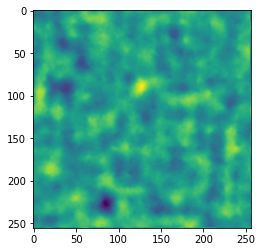

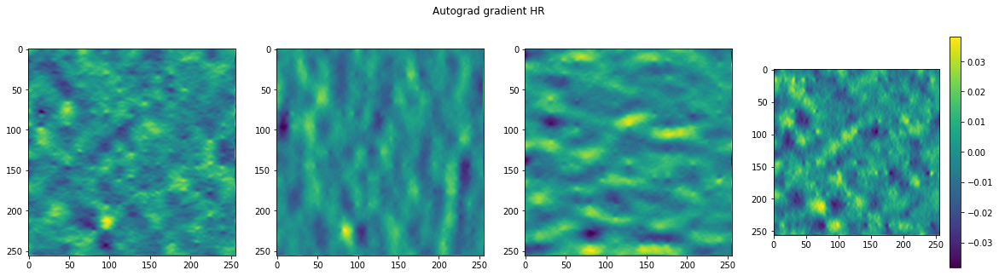

5.758733823313378e-05 0.000120964614325203 0.0001529199944343418 4.648086178349331e-05


Validating: 0it [00:00, ?it/s]

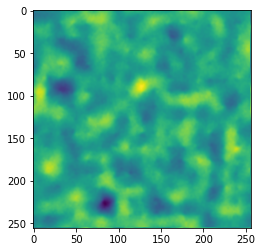

Validating: 0it [00:00, ?it/s]

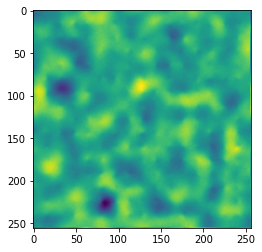

Validating: 0it [00:00, ?it/s]

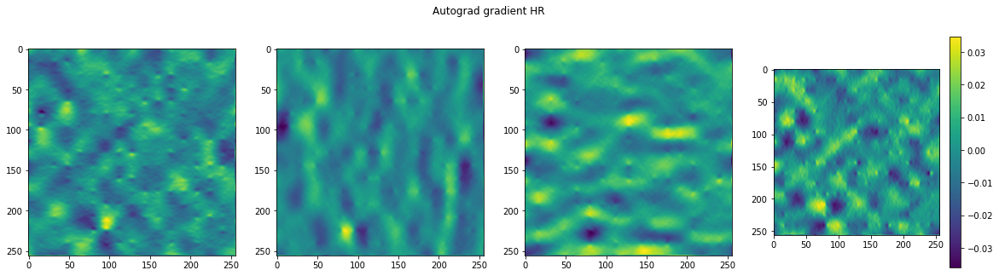

4.156889917794615e-05 0.0001326186757069081 0.00014457217184826732 2.1298968931660056e-05


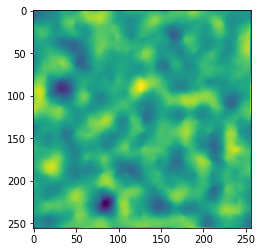

Validating: 0it [00:00, ?it/s]

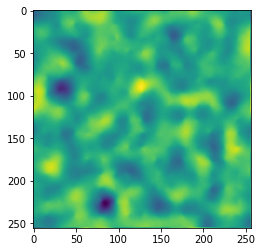

Validating: 0it [00:00, ?it/s]

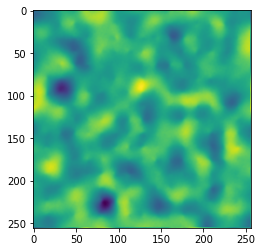

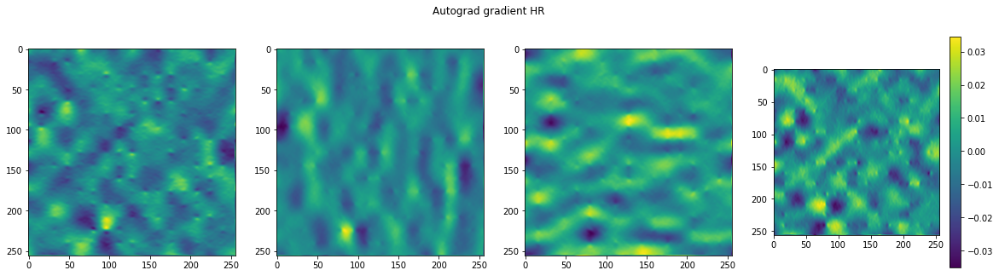

3.478264625300653e-05 0.00014521430421154946 0.00012582677300088108 1.7489934180048294e-05


Validating: 0it [00:00, ?it/s]

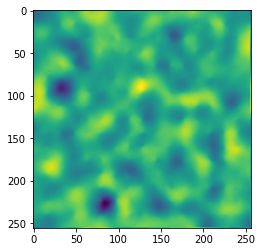

Validating: 0it [00:00, ?it/s]

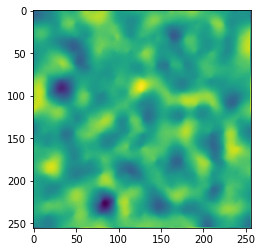

Validating: 0it [00:00, ?it/s]

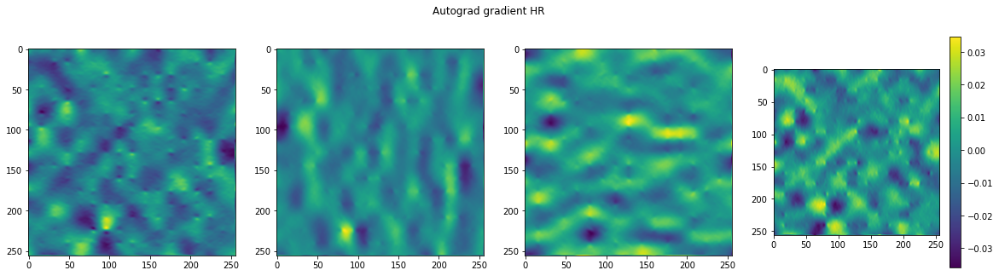

3.2687348721083254e-05 0.00015622677165083587 0.00010865183867281303 1.6365531337214634e-05


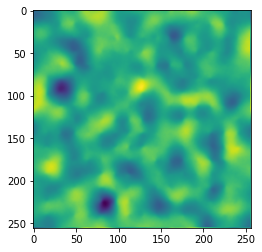

Validating: 0it [00:00, ?it/s]

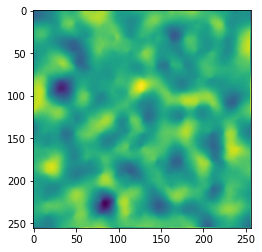

Validating: 0it [00:00, ?it/s]

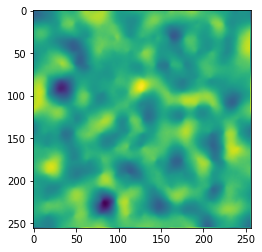

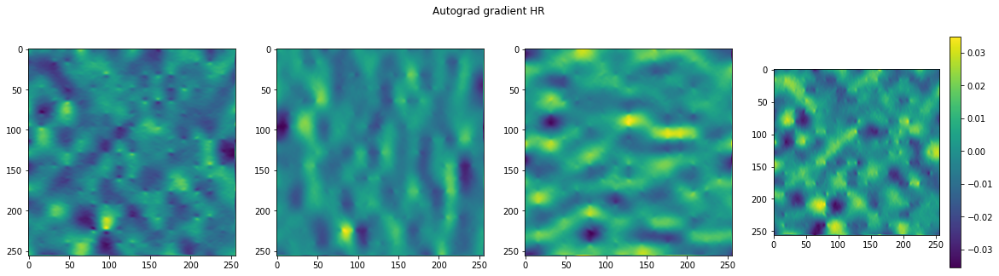

3.273097172495909e-05 0.00015979020099621266 0.00010462873615324497 1.629548023629468e-05


Validating: 0it [00:00, ?it/s]

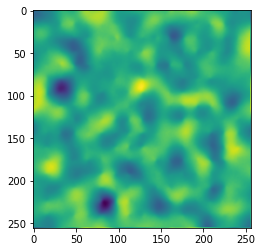

Validating: 0it [00:00, ?it/s]

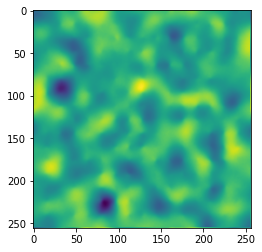

Validating: 0it [00:00, ?it/s]

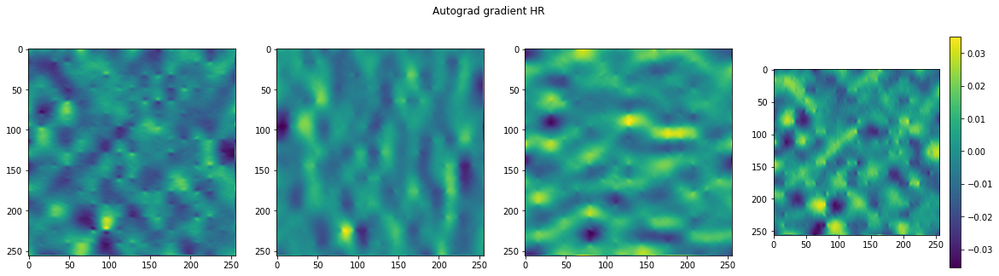

3.2613905204925686e-05 0.00016080682689789683 0.0001035411114571616 1.6295580280711874e-05


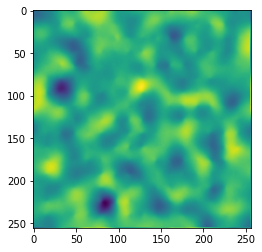

Validating: 0it [00:00, ?it/s]

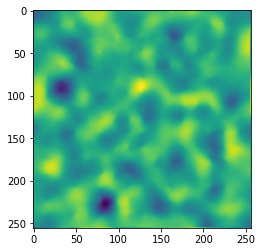

Validating: 0it [00:00, ?it/s]

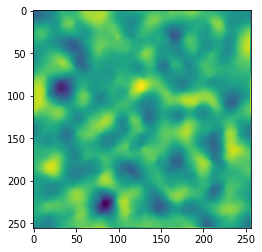

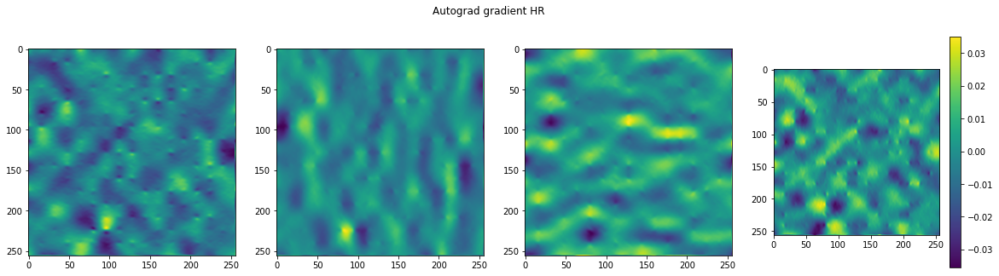

3.25340915878769e-05 0.00016185913409572095 0.00010246679448755458 1.6280118870781735e-05


Validating: 0it [00:00, ?it/s]

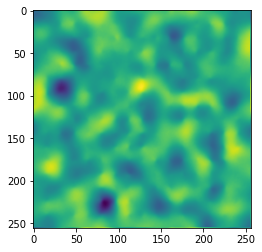

Validating: 0it [00:00, ?it/s]

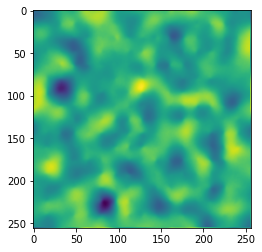

Validating: 0it [00:00, ?it/s]

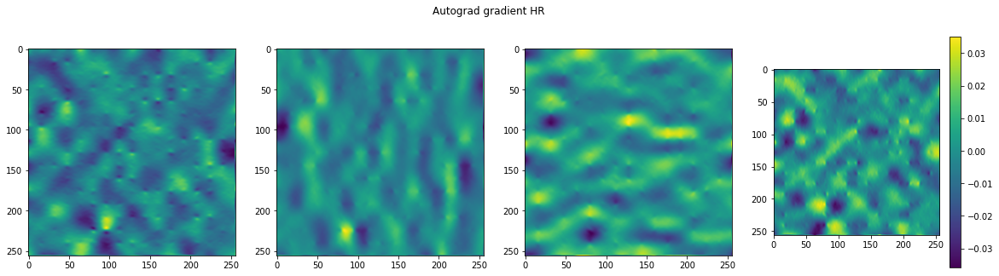

3.245798870921135e-05 0.0001629596808925271 0.00010144335828954354 1.6262332792393863e-05


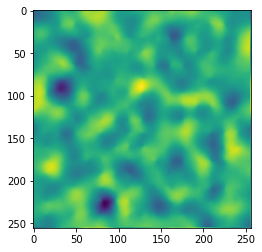

Validating: 0it [00:00, ?it/s]

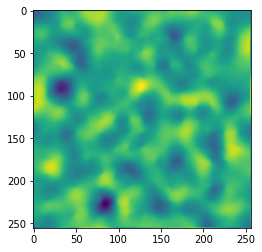

Validating: 0it [00:00, ?it/s]

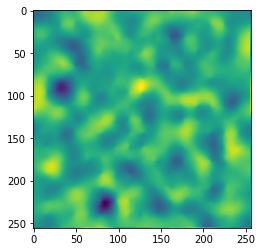

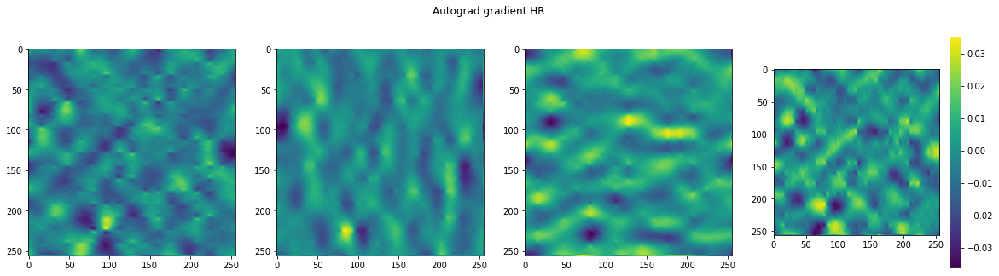

3.2386542443418875e-05 0.0001641039998503402 0.0001004996956908144 1.6246965969912708e-05


Validating: 0it [00:00, ?it/s]

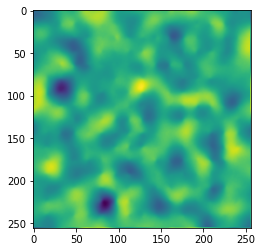

Validating: 0it [00:00, ?it/s]

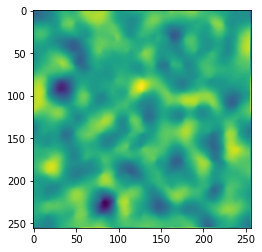

Validating: 0it [00:00, ?it/s]

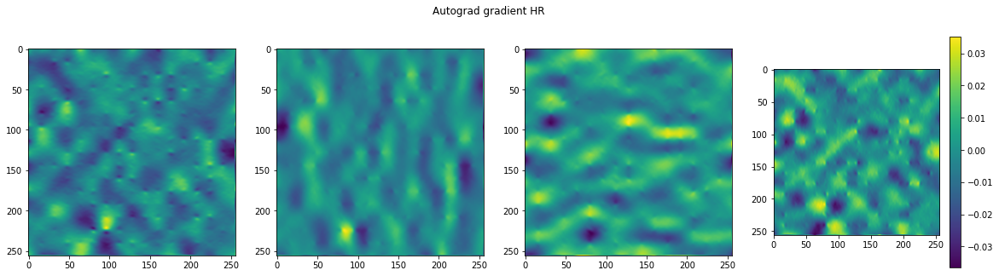

3.2319971069227904e-05 0.00016528791456948966 9.966149082174525e-05 1.6237150703091174e-05


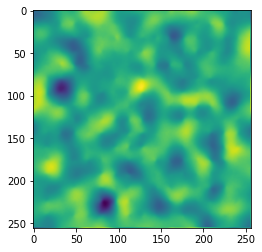

Validating: 0it [00:00, ?it/s]

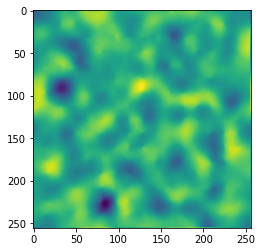

Validating: 0it [00:00, ?it/s]

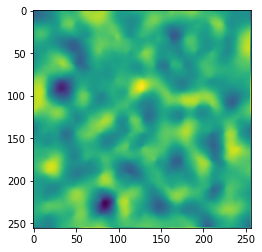

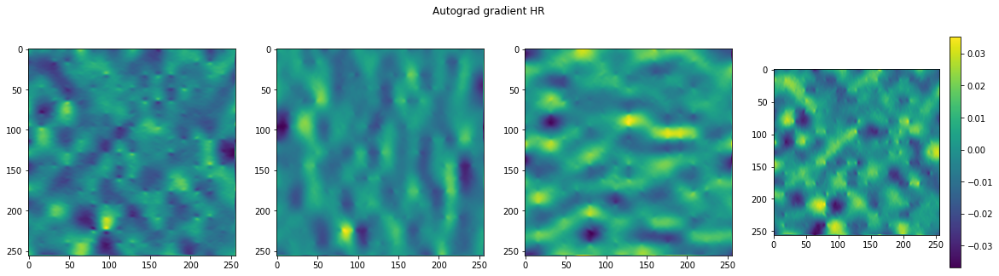

3.225874388590455e-05 0.00016650838369969279 9.894976392388344e-05 1.6234407667070627e-05


Validating: 0it [00:00, ?it/s]

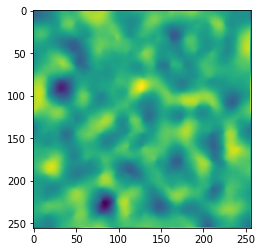

Validating: 0it [00:00, ?it/s]

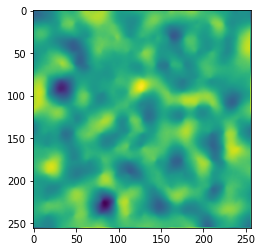

Validating: 0it [00:00, ?it/s]

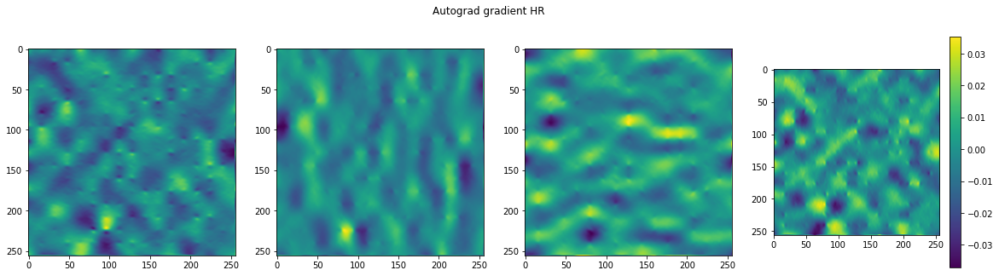

3.220334110665135e-05 0.00016776364645920694 9.83813006314449e-05 1.6239424439845607e-05


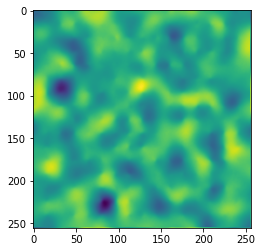

Validating: 0it [00:00, ?it/s]

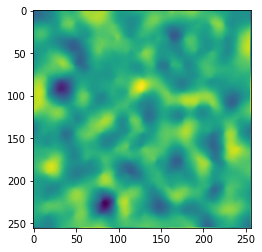

Validating: 0it [00:00, ?it/s]

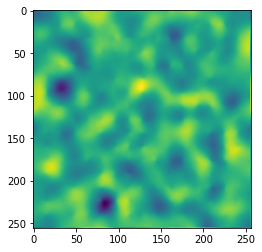

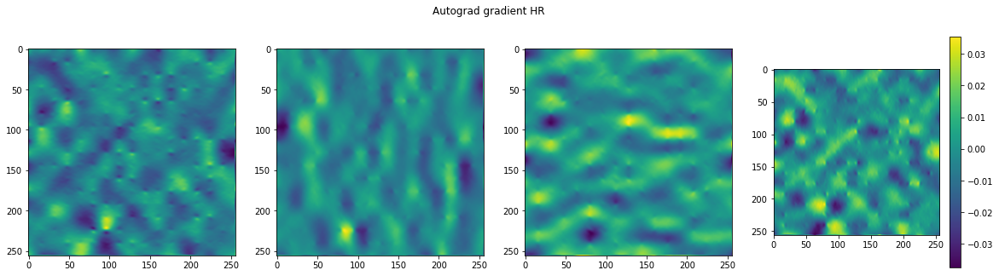

3.215405376977287e-05 0.0001690535427769646 9.79686519713141e-05 1.6252326531684957e-05


Validating: 0it [00:00, ?it/s]

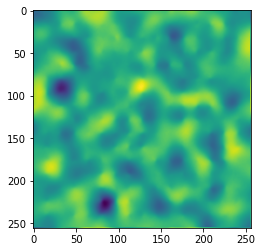

Validating: 0it [00:00, ?it/s]

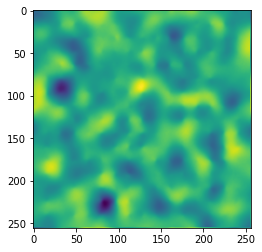

Validating: 0it [00:00, ?it/s]

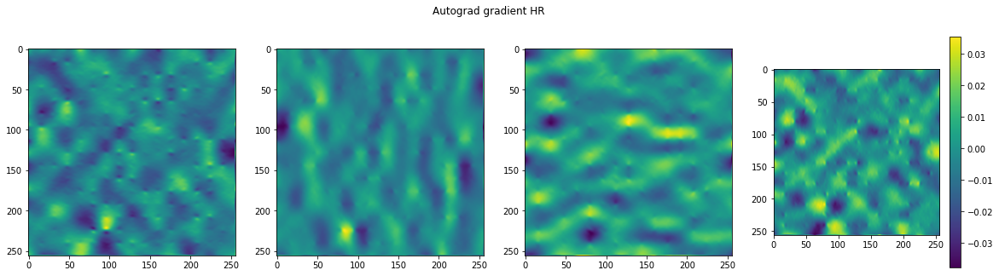

3.2110969186760485e-05 0.00017037928046192974 9.771997429197654e-05 1.627295569051057e-05


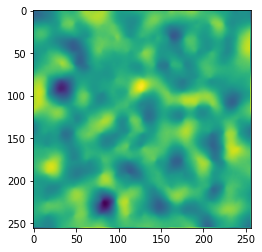

Validating: 0it [00:00, ?it/s]

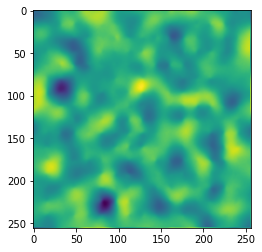

Validating: 0it [00:00, ?it/s]

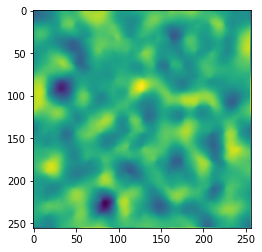

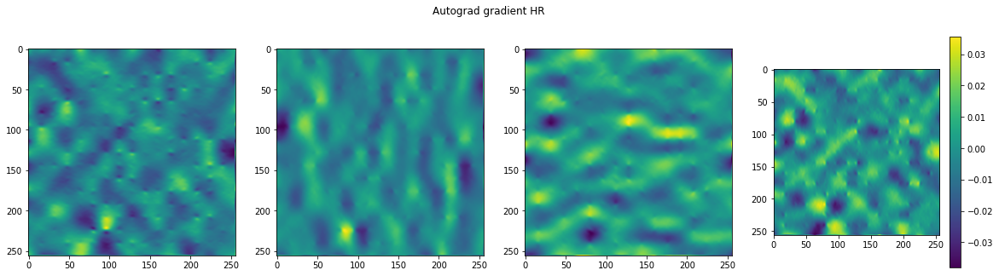

3.2074018236016855e-05 0.000171743449755013 9.763902926351875e-05 1.6300915376632474e-05


Validating: 0it [00:00, ?it/s]

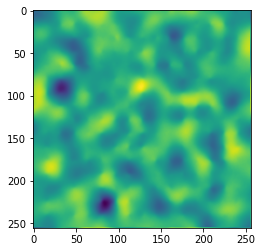

Validating: 0it [00:00, ?it/s]

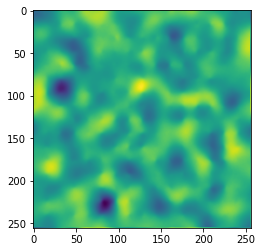

Validating: 0it [00:00, ?it/s]

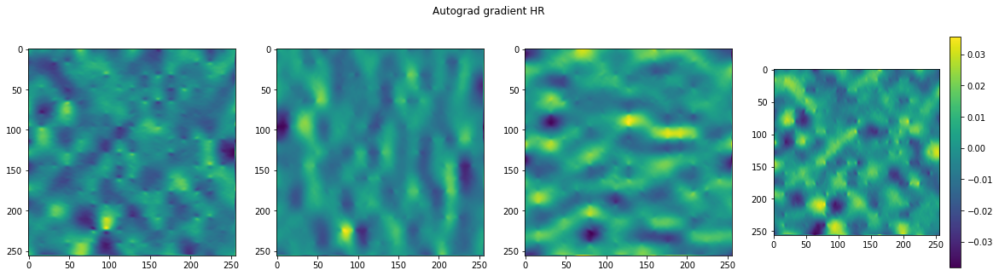

3.204288077540696e-05 0.00017314932483714074 9.772530756890774e-05 1.633574538573157e-05


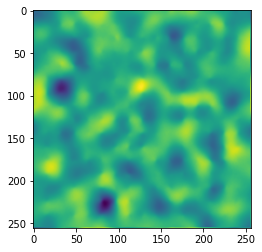

Validating: 0it [00:00, ?it/s]

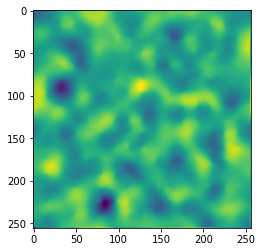

Validating: 0it [00:00, ?it/s]

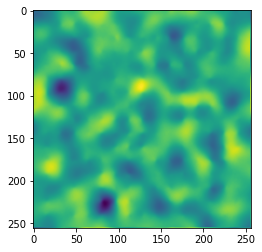

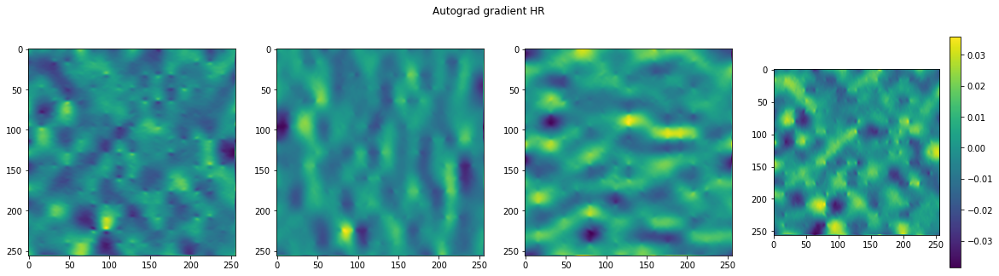

3.201698564225808e-05 0.00017460105300415307 9.797423263080418e-05 1.637691821088083e-05


Validating: 0it [00:00, ?it/s]

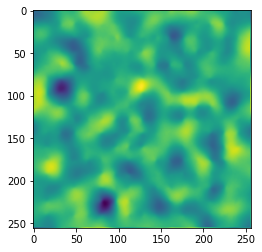

Validating: 0it [00:00, ?it/s]

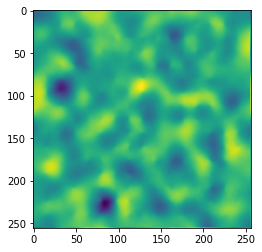

Validating: 0it [00:00, ?it/s]

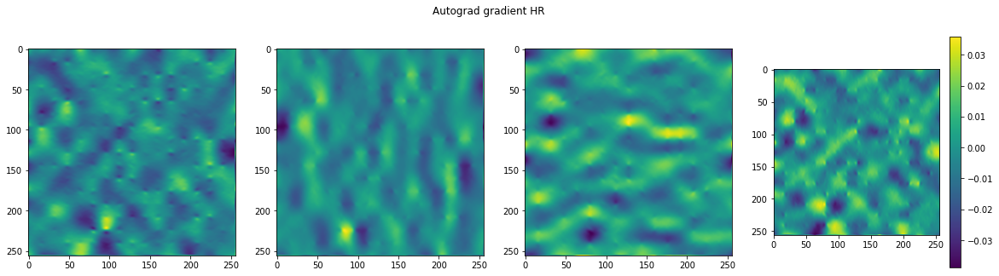

3.1995485187508166e-05 0.00017610234499443322 9.837746620178223e-05 1.6423879060312174e-05


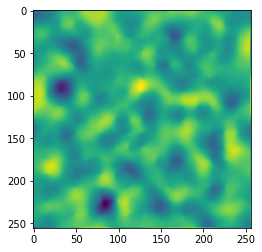

Validating: 0it [00:00, ?it/s]

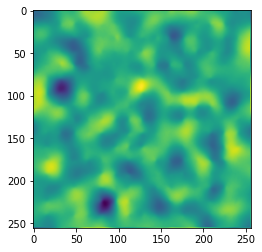

Validating: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/core/datamodule.py:423: LightningDeprecationWarning: DataModule.setup has already been called, so it will not be called again. In v1.6 this behavior will change to always call DataModule.setup.
  rank_zero_deprecation(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type            | Params
--------------------------------------------
0 | rff     | Fourier         | 1.0 K 
1 | mlp     | MLP             | 394 K 
2 | mtl     | MTL             | 4     
3 | sp_grad | SpatialGradient | 0     
--------------------------------------------
394 K     Trainable params
1.0 K     Non-trainable params
395 K     Total params
1.582     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

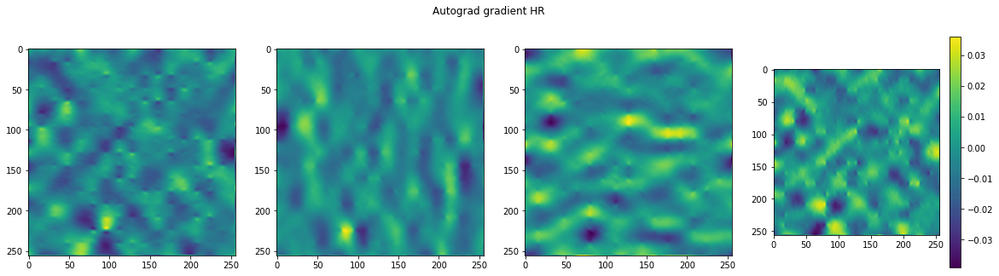

3.1980714993551373e-05 0.00017734146967995912 9.880351717583835e-05 1.646523924137e-05


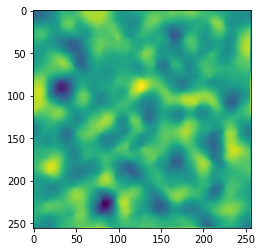

Global seed set to 67


Training: -1it [00:00, ?it/s]

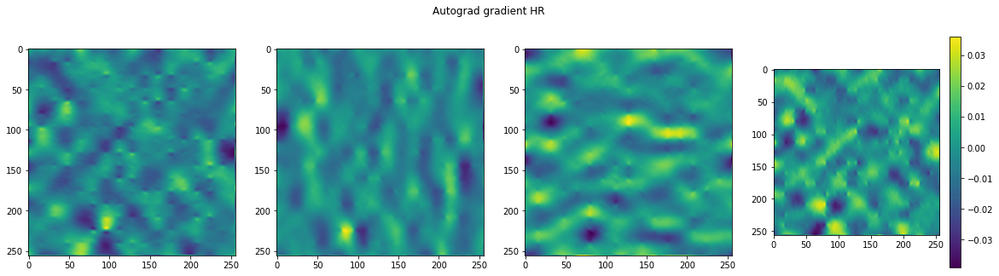

3.1980714993551373e-05 0.00017734146967995912 9.880351717583835e-05 1.646523924137e-05


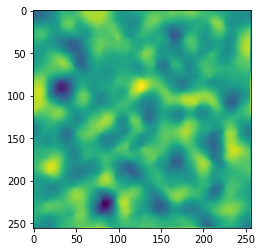

Validating: 0it [00:00, ?it/s]

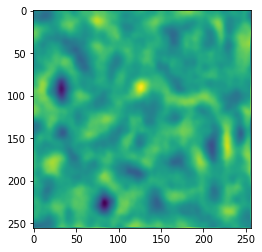

Validating: 0it [00:00, ?it/s]

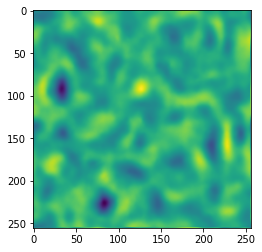

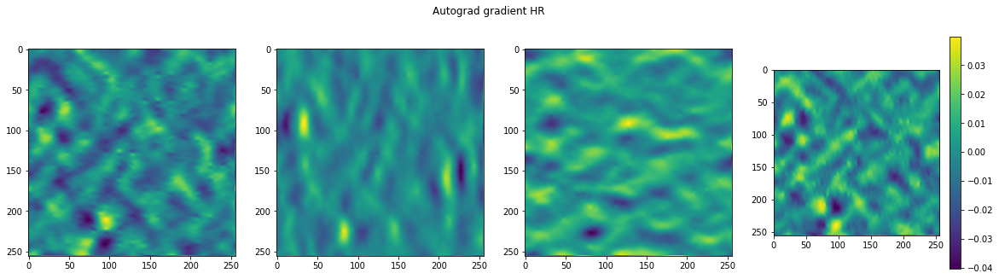

2.542784932302311e-05 9.134248830378056e-05 9.883868915494531e-05 7.898496733105276e-06


Validating: 0it [00:00, ?it/s]

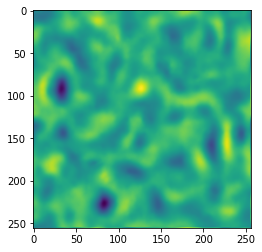

Validating: 0it [00:00, ?it/s]

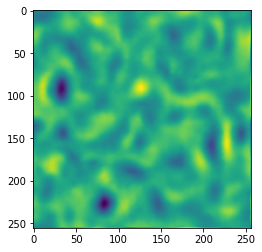

Validating: 0it [00:00, ?it/s]

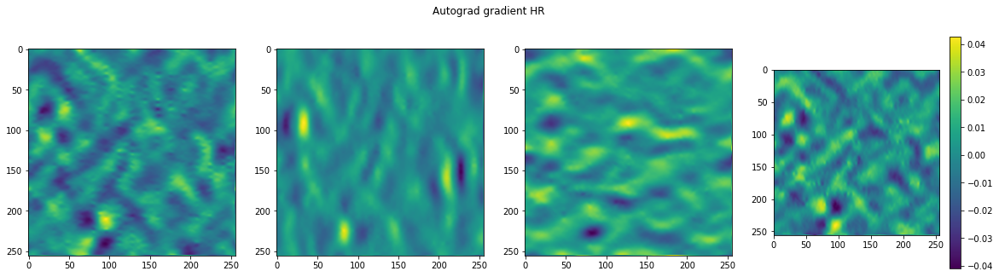

2.3372120267595164e-05 5.429082011687569e-05 9.876250987872481e-05 8.440903002338018e-06


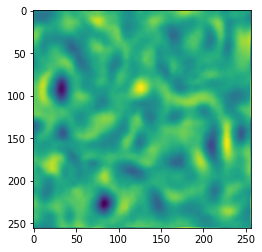

Validating: 0it [00:00, ?it/s]

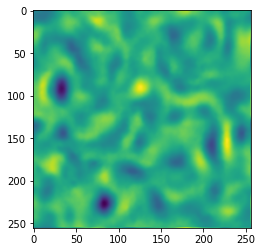

Validating: 0it [00:00, ?it/s]

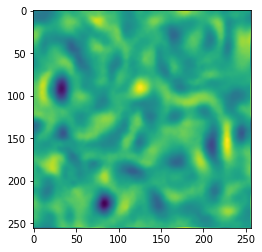

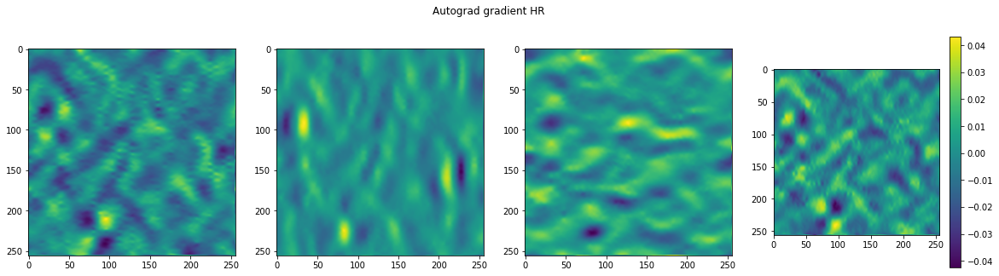

1.9491591956466436e-05 3.955533975386061e-05 9.930630039889365e-05 8.051743861869909e-06


Validating: 0it [00:00, ?it/s]

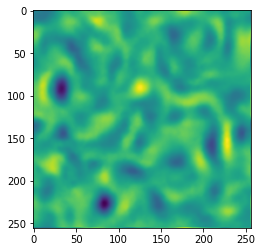

Validating: 0it [00:00, ?it/s]

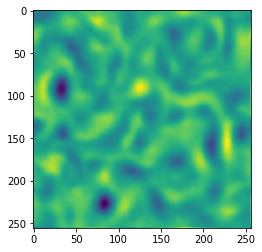

Validating: 0it [00:00, ?it/s]

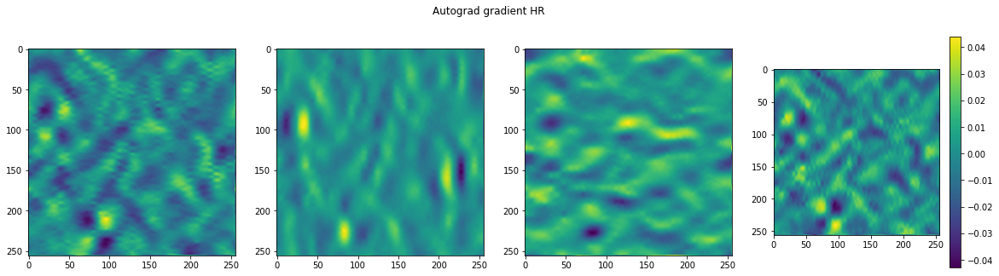

1.6723261069273576e-05 3.369695696164854e-05 0.00010239438415737823 7.905364327598363e-06


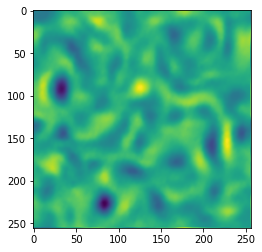

Validating: 0it [00:00, ?it/s]

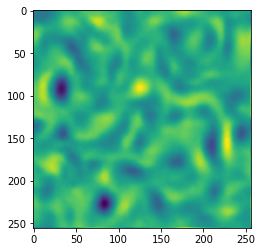

Validating: 0it [00:00, ?it/s]

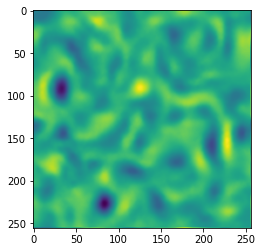

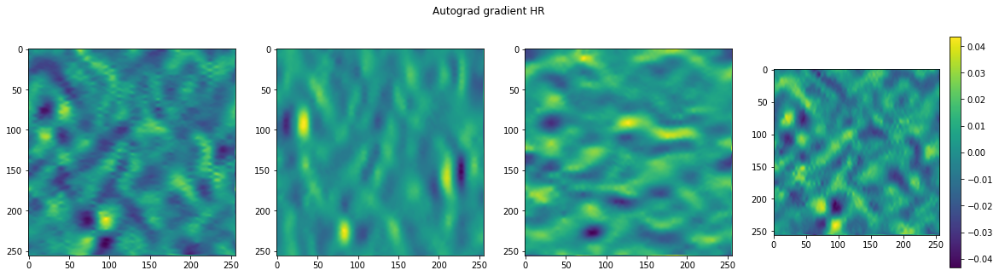

1.6619440430076793e-05 3.3588432415854186e-05 0.00010299931454937905 7.952829037094489e-06


Validating: 0it [00:00, ?it/s]

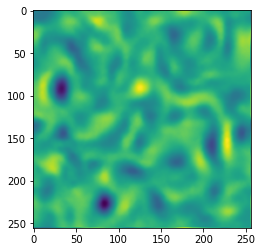

Validating: 0it [00:00, ?it/s]

In [6]:
# seed = 67
# seed_everything(seed, workers=True)

# # load dataset
# data_dir = Path('/','home','dicarlo_d','Documents','Datasets','Turb2D.hdf5')
# dm = TurboFlowDataModule(dataset='Turb2D', 
#                          data_dir=data_dir,
#                          batch_size=100000,
#                          time_idx=0,
#                          train_downsampling=16,
#                          val_downsampling=4,
#                          test_downsampling=1,
#                          num_workers=1)
# dm.setup()

# # choose the hyperparams
# hparams = {
#     'name':'RFFNet',
#     'mlp_layers_num': 3,
#     'mlp_layers_dim': 256, 
#     'mlp_last_actfn': 'tanh',
#     'do_rff': True, 
#     'rff_num': 512, 
#     'rff_scale': 10,
#     'do_divfree': False,
#     'lam_pde':  0,     # soft constr. grad(u,v)=0
#     'lam_sdiv': 1e-4,     # spatial grad(u,v) = torch.autograd(u,v)
#     'lam_sfn':  0,     # offgrid L2 reg. on Sfun
#     'lam_spec': 0,    # L2 diff on the spectrum
#     'lam_grads':1e-4,    # offrgid L2 reg. on grad and autograd
#     'lam_curl' :1e-8,       # smooth grad of vorticity
#     'lam_weight': 1e-4,  # L2 reg on the NN's weights
#     'sfn_min_x': 1./256., # maximal resolution
#     'sfn_num_centers': 16,
#     'sfn_num_increments':3,
#     'sfn_patch_dim': 16 # (P/2)
# }

# from turboflow.models.phyrff_hard import plDivFreeRFFNet
# model = plDivFreeRFFNet(**vars(Namespace(**hparams)))

# early_stop_callback = EarlyStopping(monitor='val/loss/tot',min_delta=1e-5)
# checkpoint_callback = ModelCheckpoint(
#     monitor="val/loss/tot",
#     dirpath=".torch_checkpoints",
#     filename="Turb2D-%s-{epoch:02d}-{val_loss:.2f}" % (hparams['name']),
#     save_top_k=1,
#     mode="min",
# )

# trainer = Trainer(gpus=1,
#                   max_epochs=3000, 
#                   log_every_n_steps=20,
#                   check_val_every_n_epoch=20, 
#                   callbacks=[early_stop_callback,
#                              checkpoint_callback])

# trainer.fit(model, dm)

# seed = 68
# seed_everything(seed, workers=True)
# data_dir = Path('/','home','dicarlo_d','Documents','Datasets','Turb2D.hdf5')
# dm = TurboFlowDataModule(dataset='Turb2D', 
#                          data_dir=data_dir,
#                          batch_size=100000,
#                          time_idx=0,
#                          train_downsampling=8,
#                          val_downsampling=4,
#                          test_downsampling=1,
#                          num_workers=1)
# dm.setup()

# early_stop_callback = EarlyStopping(monitor='val/loss/tot',min_delta=1e-5)
# checkpoint_callback = ModelCheckpoint(
#     monitor="val/loss/tot",
#     dirpath=".torch_checkpoints",
#     filename="Turb2D-%s-{epoch:02d}-{val_loss:.2f}" % (hparams['name']),
#     save_top_k=1,
#     mode="min",
# )

# trainer = Trainer(gpus=1,
#                   max_epochs=3000, 
#                   log_every_n_steps=20,
#                   check_val_every_n_epoch=20, 
#                   callbacks=[early_stop_callback,
#                              checkpoint_callback])
# trainer.fit(model, dm)

In [7]:
checkpoint_callback.best_model_path

'/home/dicarlo_d/Documents/Code/TurboSuperResultion/notebooks/.torch_checkpoints/Turb2D-RFFNet-epoch=279-val_loss=0.00-v8.ckpt'

In [8]:
dsets_dict = {}

dsets = {
    'train' : dm.train_dataset,
    'val' : dm.val_dataset,
    'test' : dm.test_dataset
}

for stage in dsets.keys():
    tmp = {}
    
    dset = dsets[stage]
    X, y = dset[:]
    img_shape = dset.img_shape[:2]
    shape = dset.img_shape
    R = shape[0]
    
    print(stage, X.shape, y.shape, R)
    
    tmp['X'] = X
    tmp['y'] = y
    tmp['R'] = R
    tmp['img_shape'] = img_shape
    
    dsets_dict[stage] = tmp

train torch.Size([1024, 2]) torch.Size([1024, 2]) 32
val torch.Size([4096, 2]) torch.Size([4096, 2]) 64
test torch.Size([65536, 2]) torch.Size([65536, 2]) 256


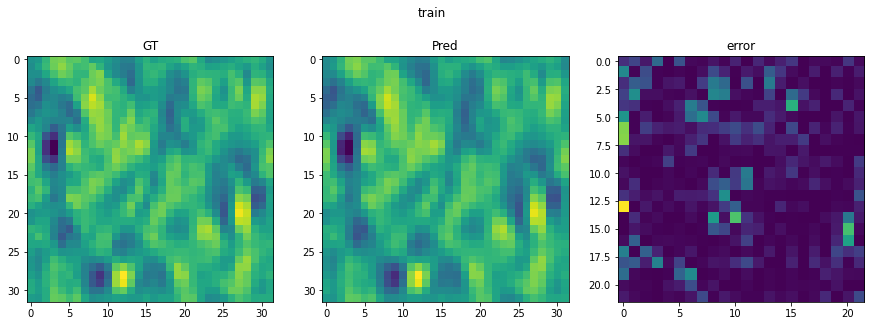

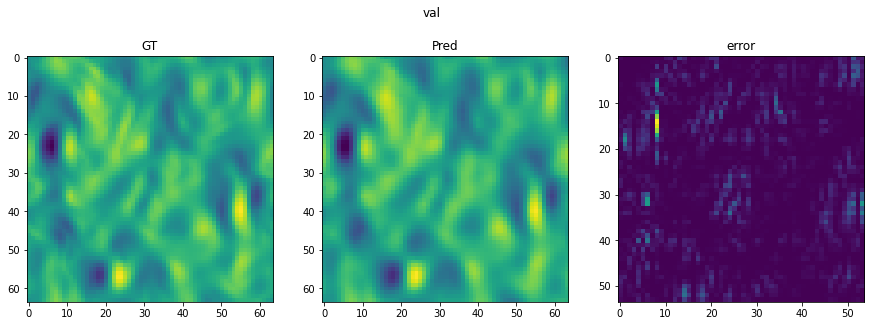

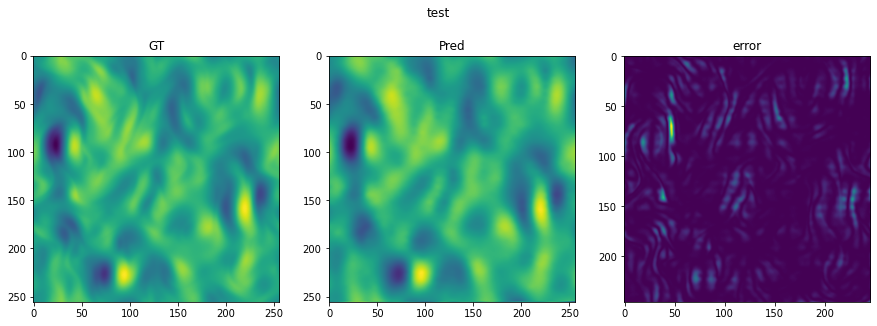

In [9]:
for stage in dsets_dict.keys():
    
    data = dsets_dict[stage]
    X = data['X']
    y = data['y']
    R = data['R']
    
    y_hat, P_hat = model(X)

    err = torch.abs(y_hat - y)**2

    plt.figure(figsize=(15,5))
    plt.suptitle(f'{stage}')
    plt.subplot(131)
    plt.title('GT')
    plt.imshow(y[:,0].view(R,R).detach())
    plt.subplot(132)
    plt.title('Pred')
    plt.imshow(y_hat[:,0].view(R,R).detach())
    plt.subplot(133)
    plt.title('error')
    plt.imshow(err[:,0].view(R,R)[5:-5,5:-5].detach())
    plt.show()

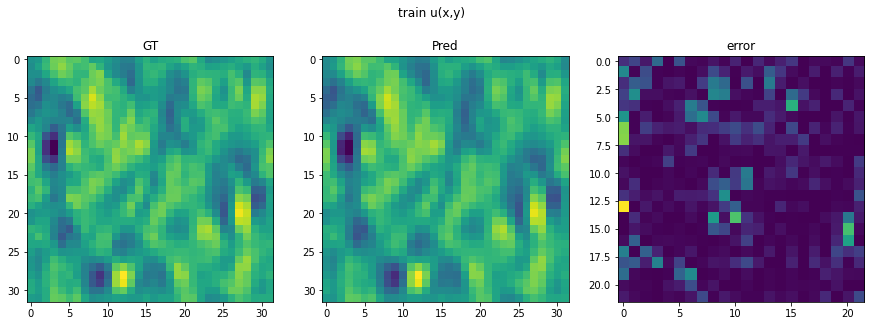

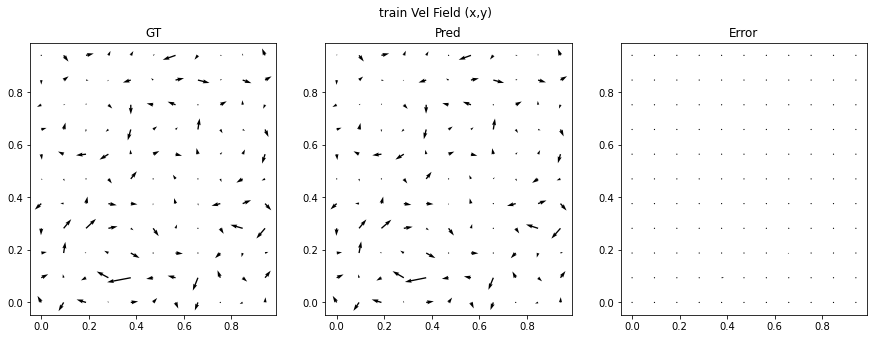

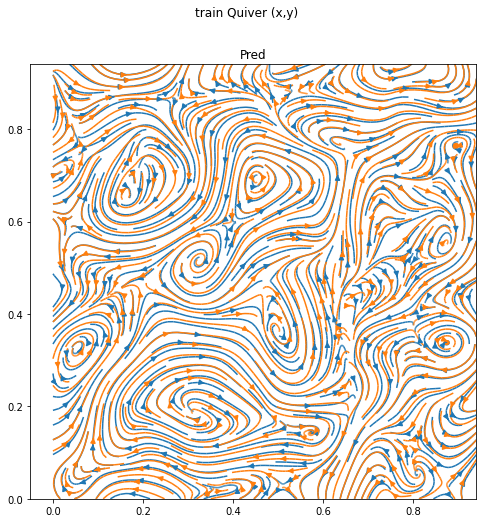

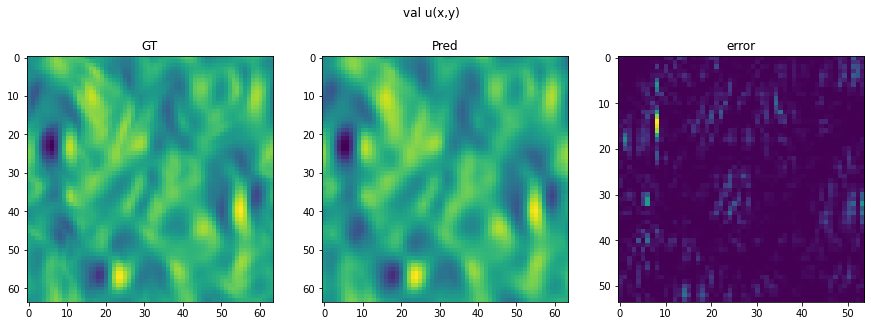

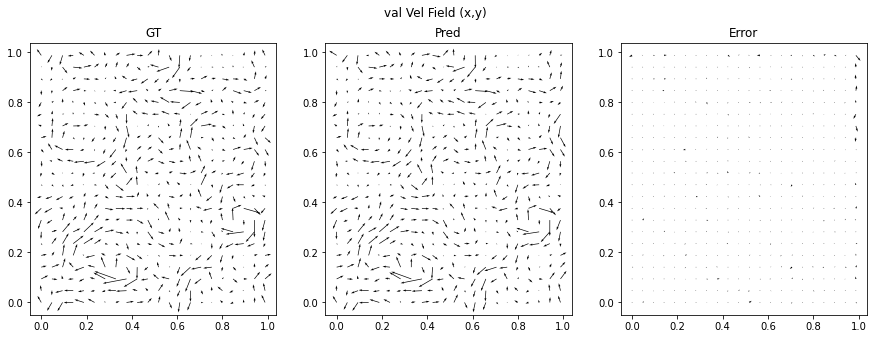

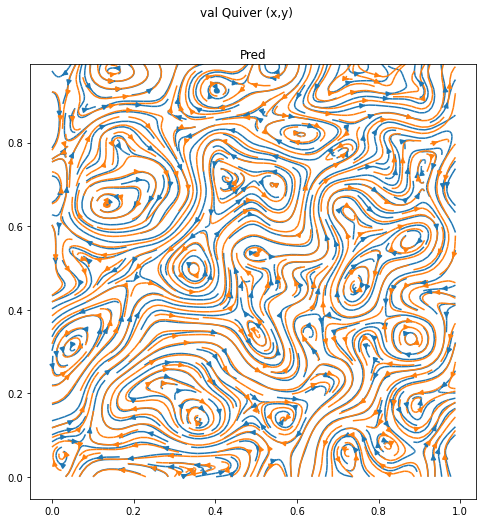

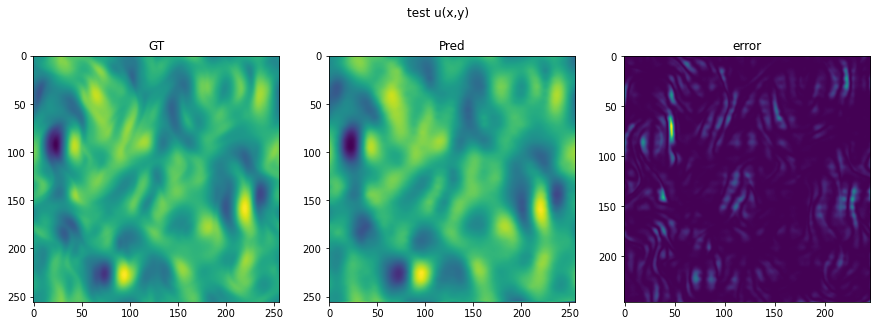

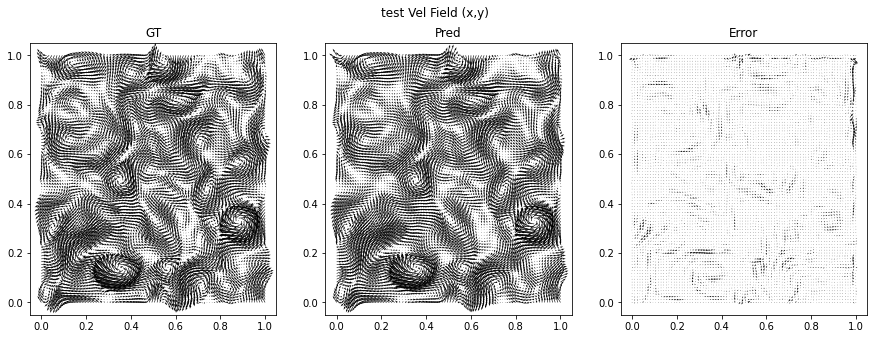

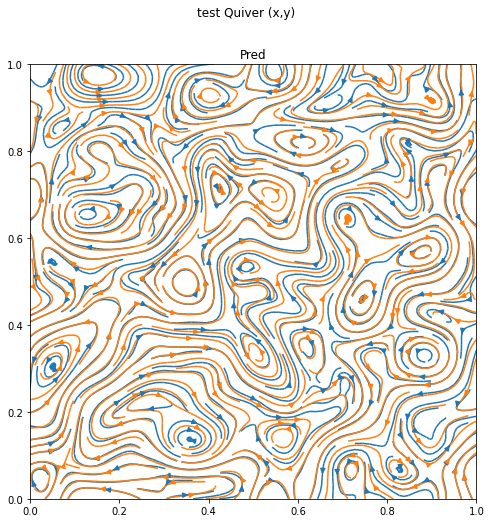

In [28]:
for stage in dsets_dict.keys():
    
    data = dsets_dict[stage]
    X = data['X']
    y = data['y']
    R = data['R']
    
    y_hat, P_hat = model(X)

    diff = y_hat - y
    err = torch.abs(diff)**2

    plt.figure(figsize=(15,5))
    plt.suptitle(f'{stage} u(x,y)')
    plt.subplot(131)
    plt.title('GT')
    plt.imshow(y[:,0].view(R,R).detach())
    plt.subplot(132)
    plt.title('Pred')
    plt.imshow(y_hat[:,0].view(R,R).detach())
    plt.subplot(133)
    plt.title('error')
    plt.imshow(err[:,0].view(R,R)[5:-5,5:-5].detach())
    plt.show()
    
    
    s = 3
    plt.figure(figsize=(15,5))
    plt.suptitle(f'{stage} Vel Field (x,y)')
    plt.subplot(131)
    plt.title('GT')
    plt.quiver(X[:,0].view(R,R)[::s,::s].detach(), 
               X[:,1].view(R,R)[::s,::s].detach(),
               y[:,0].view(R,R)[::s,::s].detach(),
               y[:,1].view(R,R)[::s,::s].detach(), scale=10)
    plt.subplot(132)
    plt.title('Pred')
    plt.quiver(X[:,0].view(R,R)[::s,::s].detach(), 
               X[:,1].view(R,R)[::s,::s].detach(),
               y_hat[:,0].view(R,R)[::s,::s].detach(),
               y_hat[:,1].view(R,R)[::s,::s].detach(), scale=10)
    plt.subplot(133)
    plt.title('Error')
    plt.quiver(X[:,0].view(R,R)[::s,::s].detach(), 
               X[:,1].view(R,R)[::s,::s].detach(),
               diff[:,0].view(R,R)[::s,::s].detach(),
               diff[:,1].view(R,R)[::s,::s].detach(), scale=10)
    plt.show()
    
    plt.figure(figsize=(8,8))
    plt.suptitle(f'{stage} Quiver (x,y)')
    plt.title('GT')
    plt.streamplot(        
               X[:,0].view(R,R)[::s,::s].T.detach().numpy(), 
               X[:,1].view(R,R)[::s,::s].T.detach().numpy(),
               y[:,0].view(R,R)[::s,::s].T.detach().numpy(),
               y[:,1].view(R,R)[::s,::s].T.detach().numpy(), density=2)
    plt.title('Pred')
    plt.streamplot(
                   X[:,0].view(R,R)[::s,::s].T.detach().numpy(), 
                   X[:,1].view(R,R)[::s,::s].T.detach().numpy(),
               y_hat[:,0].view(R,R)[::s,::s].T.detach().numpy(),
               y_hat[:,1].view(R,R)[::s,::s].T.detach().numpy(), density=2)
    plt.show()

Stage train 32
Stage val 64
Stage test 256
Stage train 32
Stage val 64
Stage test 256


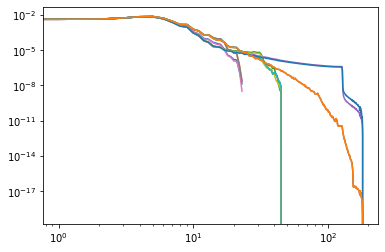

In [36]:
model_paths = [
    '/home/dicarlo_d/Documents/Code/TurboSuperResultion/notebooks/.torch_checkpoints/Turb2D-RFFNet-epoch=599-val_loss=0.00-v1.ckpt',
    '/home/dicarlo_d/Documents/Code/TurboSuperResultion/notebooks/.torch_checkpoints/Turb2D-RFFNet-epoch=279-val_loss=0.00-v8.ckpt',
]

for path in model_paths:
    
    model = plDivFreeRFFNet.load_from_checkpoint(path)
    
    for stage in dsets_dict.keys():

        data = dsets_dict[stage]
        X = data['X']
        y = data['y']
        R = data['R']

        y_hat, P_hat = model(X)

        diff = y_hat - y
        err = torch.abs(diff)**2

        print('Stage', stage, R)
#         print(compute_all_metrics(y_hat, y))
        
        spec = phy.energy_spectrum(y_hat.view(R,R,2).permute(2,0,1))[0]
        spec_gt = phy.energy_spectrum(y.view(R,R,2).permute(2,0,1))[0]
        plt.loglog(spec.detach())
        plt.loglog(spec_gt.detach())
        
        
        